In [3]:
! pip install numpy pandas matplotlib scipy scikit-learn seaborn prettytable 


[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy as sp
import sklearn as sk
import seaborn as sns


### Чтение файла + базовое знание о нём

In [5]:
df = pd.read_csv('turkiye-student-evaluation_generic.csv')

In [6]:
print(df.head())
print (df.info())
print(df.shape)

   instr  class  nb.repeat  attendance  difficulty  Q1  Q2  Q3  Q4  Q5  ...  \
0      1      2          1           0           4   3   3   3   3   3  ...   
1      1      2          1           1           3   3   3   3   3   3  ...   
2      1      2          1           2           4   5   5   5   5   5  ...   
3      1      2          1           1           3   3   3   3   3   3  ...   
4      1      2          1           0           1   1   1   1   1   1  ...   

   Q19  Q20  Q21  Q22  Q23  Q24  Q25  Q26  Q27  Q28  
0    3    3    3    3    3    3    3    3    3    3  
1    3    3    3    3    3    3    3    3    3    3  
2    5    5    5    5    5    5    5    5    5    5  
3    3    3    3    3    3    3    3    3    3    3  
4    1    1    1    1    1    1    1    1    1    1  

[5 rows x 33 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5820 entries, 0 to 5819
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype
---  ------      -------------- 

### Задание 1. Предложить методы анализа выбросов, учитывая особенности данных. Сделать анализ выбросов, удалить выбросы.

Начнём с проверки того, что все значения лежат в описанных вначале диапазонах 

instr: идентификатор инструктора; значения взяты из {1,2,3}

class: Код курса(дескриптор); значения взяты из {1-13}

repeat: сколько раз студент проходил этот курс; значения взяты из {0,1,2,3, ...}

attendance: Код уровня посещаемости; значения из {0, 1, 2, 3, 4}

difficulty: уровень сложности курса, который воспринимается студентом; значения взяты из {1,2,3,4,5}

Q1-Q28 все относятся к типу Лайкерта, что означает, что значения взяты из {1,2,3,4,5}

In [7]:
allowed_values = {
    'instr':       {1, 2, 3},
    'class':       set(range(1, 14)),        # 1..13
    'nb.repeat':   None,                     # особая проверка ниже
    'attendance':  {0, 1, 2, 3, 4},
    'difficulty':  {1, 2, 3, 4, 5},
}

for q in range(1, 29):
    allowed_values[f'Q{q}'] = {1, 2, 3, 4, 5}

for col, allowed in allowed_values.items():
    if col not in df.columns:
        print(f'⚠️ Столбец {col} не найден в датафрейме')
        continue

    if allowed is not None:
        invalid_rows = df[~df[col].isin(allowed)]
    else:
        # сюда попадает только nb.repeat
        continue

    if len(invalid_rows) > 0:
        print(f'❌ Нарушения в столбце {col}: {len(invalid_rows)} значений вне допустимого множества {allowed}')
        print('Примеры значений:', invalid_rows[col].unique()[:10])
    else:
        print(f'✅ {col}: все значения в допустимом множестве {allowed}')

if 'nb.repeat' in df.columns:
    invalid_nb = df[df['nb.repeat'] < 0]
    if len(invalid_nb) > 0:
        print(f'❌ nb.repeat: найдено {len(invalid_nb)} отрицательных значений')
        print('Примеры:', invalid_nb['nb.repeat'].unique()[:10])
    else:
        print('✅ nb.repeat: все значения неотрицательные (0,1,2,...)')
else:
    print('⚠️ Столбец nb.repeat не найден в датафрейме')

✅ instr: все значения в допустимом множестве {1, 2, 3}
✅ class: все значения в допустимом множестве {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13}
✅ attendance: все значения в допустимом множестве {0, 1, 2, 3, 4}
✅ difficulty: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q1: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q2: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q3: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q4: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q5: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q6: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q7: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q8: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q9: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q10: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q11: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q12: все значения в допустимом множестве {1, 2, 3, 4, 5}
✅ Q13: все значения в доп

При анализе выбросов с учётом особенностей данных было принято решение удалить студентов, которые не посещали курс (attendance = 0) и одновременно проходили его впервые (nb.repeat = 1).
Такие ответы нельзя считать информированными, так как студенты не имели возможности составить мнение о преподавателе и содержании дисциплины.
При этом студенты, повторно проходящие курс, были сохранены, поскольку они могли оценивать преподавателя на основе опыта предыдущего прохождения.

In [8]:
df = df[~((df['attendance'] == 0) & (df['nb.repeat'] == 1))].reset_index(drop=True)
print(f"✅ После удаления осталось {df.shape[0]} наблюдений.")

✅ После удаления осталось 4206 наблюдений.


In [9]:
remaining_zero_attendance = df[df['attendance'] == 0]

print(f"Количество записей с attendance = 0 после удаления: {len(remaining_zero_attendance)}")
print("Распределение по количеству повторений курса (nb.repeat):")
display(remaining_zero_attendance['nb.repeat'].value_counts().sort_index())

Количество записей с attendance = 0 после удаления: 288
Распределение по количеству повторений курса (nb.repeat):


nb.repeat
2    164
3    124
Name: count, dtype: int64

После удаления студентов, впервые проходящих курс и не посещавших занятия, в выборке осталось **288 записей** студентов,  
которые не посещали курс в текущем семестре, но проходили его ранее.

Эти ответы не считаются грубыми выбросами, поскольку:
- студенты уже знакомы с программой и преподавателем;
- их оценки могут отражать опыт предыдущего прохождения курса;
- доля таких записей невелика (около 5%).

Для сохранения репрезентативности и полноты анализа эти записи **оставлены в выборке**.

### Анализ повторяющихся ответов в конце опроса

In [10]:
questions_to_check = [f"Q{i}" for i in range(21, 29)]

# строка считается подозрительной, если все ответы с Q21 по Q28 одинаковые (1 либо 5)
repeating_answer_rows = df[questions_to_check].apply(lambda row: all(x == 1 or x == 5 for x in row), axis=1)

rows_to_drop = df[repeating_answer_rows]

print("Подозрительные анкеты с однообразными ответами в хвосте (Q21+):")
display(rows_to_drop.head())

print(f"Количество записей до удаления: {df.shape}")
df.drop(rows_to_drop.index, inplace=True)
print(f"Колчисетво записей после удаления: {df.shape}")




Подозрительные анкеты с однообразными ответами в хвосте (Q21+):


,instr,class,nb.repeat,attendance,difficulty,Q1,Q2,Q3,Q4,Q5,...,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28
1,1,2,1,2,4,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
5,1,2,1,1,3,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
11,1,2,1,1,2,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
14,1,2,1,3,4,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
16,1,2,1,1,4,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


Количество записей до удаления: (4206, 33)
Колчисетво записей после удаления: (3299, 33)


#### Студенты, указавшие высокую сложность курса (difficulty ≥ 4), но поставившие низкие оценки по остальным вопросам (среднее значение Q1–Q28 ≤ 2), рассматривались как потенциально необъективные.

In [11]:
# средняя оценка по вопросам Q1–Q28
q_cols = [f'Q{i}' for i in range(1, 29)]
df['mean_Q'] = df[q_cols].mean(axis=1)

# Критерий противоречивости:
# Сложность >= 4 и средние оценки <= 2
contradictory = df[(df['difficulty'] >= 4) & (df['mean_Q'] <= 2)]

print(f"Количество потенциально противоречивых ответов: {len(contradictory)}")

display(contradictory.head())

Количество потенциально противоречивых ответов: 129


,instr,class,nb.repeat,attendance,difficulty,Q1,Q2,Q3,Q4,Q5,...,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,mean_Q
18,1,2,1,2,4,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2.000000
24,1,2,1,2,4,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2.000000
98,1,2,1,3,5,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2.000000
119,1,2,1,3,4,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2.000000
180,1,7,1,4,4,3,3,2,2,1,...,3,1,1,1,1,3,1,1,1,1.678571


In [12]:
before = df.shape[0]

df = df[~((df['difficulty'] >= 4) & (df['mean_Q'] <= 2))].reset_index(drop=True)

after = df.shape[0]
removed = before - after

print(f"Удалено противоречивых ответов: {removed}")
print(f"Осталось записей после очистки: {after}")

Удалено противоречивых ответов: 129
Осталось записей после очистки: 3170


### Удаление анкет с низкой вариативностью ответов

- вычислена дисперсия ответов по всем вопросам Q1–Q28 для каждого студента;
- при дисперсии < 0.25 ответы считаются ответами с низкой вовлечённостью;
- дополнительно учтено, что студент посещал курс (`attendance = 1`) и оценил его как сложный (`difficulty ∈ {3,4,5}`).

Такие анкеты отражают **формальное участие без аналитической оценки** курса, поэтому они были удалены как потенциально неинформативные.


In [13]:
questions = [f"Q{i}" for i in range(1, 29)]

df['row_variance'] = df[questions].var(axis=1)

# Порог для "низкой дисперсии" (все ответы примерно одинаковы)
variance_threshold = 0.25

# Условия: низкая вариативность + посещаемость = 1 + сложность высокая
low_var_mask = df['row_variance'] < variance_threshold
cond_attendance = df['attendance'] == 1
cond_difficulty = df['difficulty'].isin([3, 4, 5])

mask_to_drop = low_var_mask & cond_attendance & cond_difficulty

rows_to_drop = df[mask_to_drop]

print(f"Количество анкет с низкой дисперсией и высокой сложностью: {rows_to_drop.shape[0]}")
display(rows_to_drop.head())

print(f"Размер датасета до удаления: {df.shape}")
df.drop(rows_to_drop.index, inplace=True)
df.reset_index(drop=True, inplace=True)
print(f"Размер датасета после удаления: {df.shape}")


Количество анкет с низкой дисперсией и высокой сложностью: 361


,instr,class,nb.repeat,attendance,difficulty,Q1,Q2,Q3,Q4,Q5,...,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,mean_Q,row_variance
0,1,2,1,1,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3.000000,0.000000
1,1,2,1,1,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3.000000,0.000000
3,1,2,1,1,3,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.000000,0.000000
4,1,2,1,1,3,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.035714,0.035714
15,1,2,1,1,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3.000000,0.000000


Размер датасета до удаления: (3170, 35)
Размер датасета после удаления: (2809, 35)


Две последующие проверки проводились в самом начале, как анализ очевидных тезисов типа "Дубликаты анкет при выгрузке системой" или "Коллективное прохождение опроса", однако не были удалены из-за большого количества отобранных анкет по критерию индентичности и "одинаковости" ответов

In [14]:
q_cols = [f'Q{i}' for i in range(1, 29)]

duplicates = df[df.duplicated(subset=q_cols, keep=False)]

print(f"Количество полностью идентичных анкет: {duplicates.shape[0]}")
display(duplicates.head())

Количество полностью идентичных анкет: 1135


,instr,class,nb.repeat,attendance,difficulty,Q1,Q2,Q3,Q4,Q5,...,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,mean_Q,row_variance
0,1,2,1,3,3,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.0,0.0
1,1,2,1,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.0,0.0
2,1,2,1,3,4,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3.0,0.0
3,1,2,1,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3.0,0.0
4,1,2,1,2,3,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.0,0.0


In [15]:
df['is_fully_constant'] = df[q_cols].apply(lambda row: len(set(row)) == 1, axis=1)
fully_constant = df[df['is_fully_constant']]
print(f"Количество анкет, где все ответы одинаковы: {fully_constant.shape[0]}")
display(duplicates.head())

Количество анкет, где все ответы одинаковы: 1017


,instr,class,nb.repeat,attendance,difficulty,Q1,Q2,Q3,Q4,Q5,...,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,mean_Q,row_variance
0,1,2,1,3,3,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.0,0.0
1,1,2,1,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.0,0.0
2,1,2,1,3,4,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3.0,0.0
3,1,2,1,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3.0,0.0
4,1,2,1,2,3,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4.0,0.0


### 2. Проанализировать матрицу корреляций оценок по различным критериям качества преподавания. Выявить значимые корреляции. Объяснить высокие и низкие корреляции

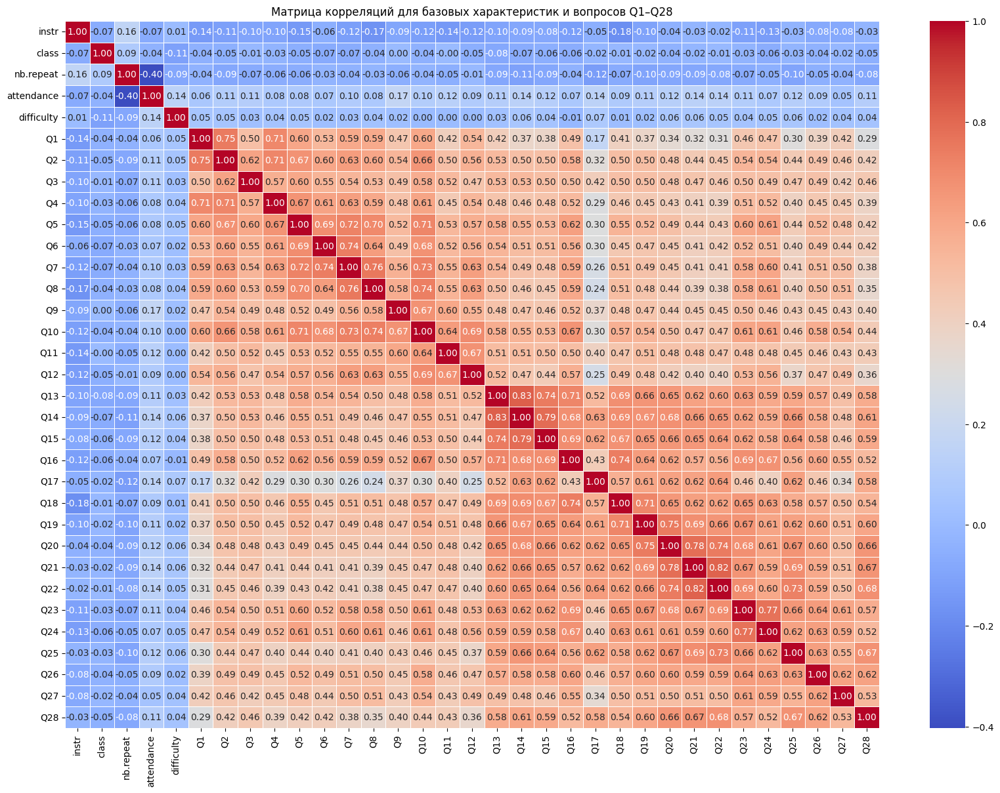

In [16]:
meta_cols = ['instr', 'class', 'nb.repeat', 'attendance', 'difficulty']
q_cols = [f"Q{i}" for i in range(1, 29)]

cols_to_corr = meta_cols + q_cols

correlation_matrix = df[cols_to_corr].corr()

plt.figure(figsize=(20, 14))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Матрица корреляций для базовых характеристик и вопросов Q1–Q28')
plt.show()


Вопросы внутри тематических блоков («структура курса» и «качество преподавателя») имеют сильные взаимосвязи.

Между блоками наблюдаются умеренные и низкие корреляции — студенты различают организацию курса и личные качества преподавателя, что подтверждает содержательную валидность анкеты.

Матрица корреляций показала сильные связи между вопросами внутри тематических блоков и слабые — между блоками.
Это означает, что студенты воспринимают отдельные аспекты качества преподавания осознанно и дифференцированно: преподаватель, структура курса и вовлечённость — это разные, но взаимосвязанные измерения обучения.

Высокие корреляции:

Q13–Q16 (≈ 0.8): актуальность знаний и понятность объяснений преподавателя формируют общий образ компетентности

Q23–Q24 (0.77): помощь, домашние задания и поощрение за активное участие в курсе воспринимаются студентами как мотивация к прохождению

Низкие корреляции:

Q4–Q17 (0.29): объявление программы в первый день занятия не зависит от прибытия преподавателя вовремя на урок 

В целом вопрос касаемо опозданий (Q17) преподавателя на занятия почти не влияет на другие вопросы в анкете в отличие от вопроса касаемо дикции преподавателя (Q18)

### 3. Сравнить матрицы корреляций для разных предметов

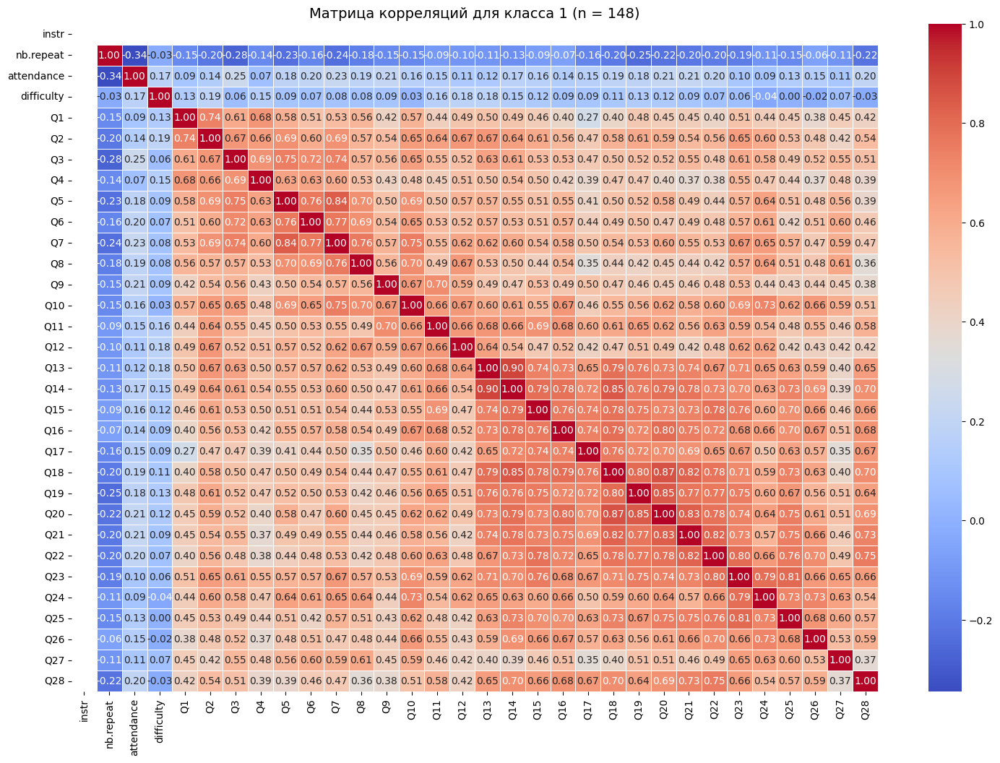

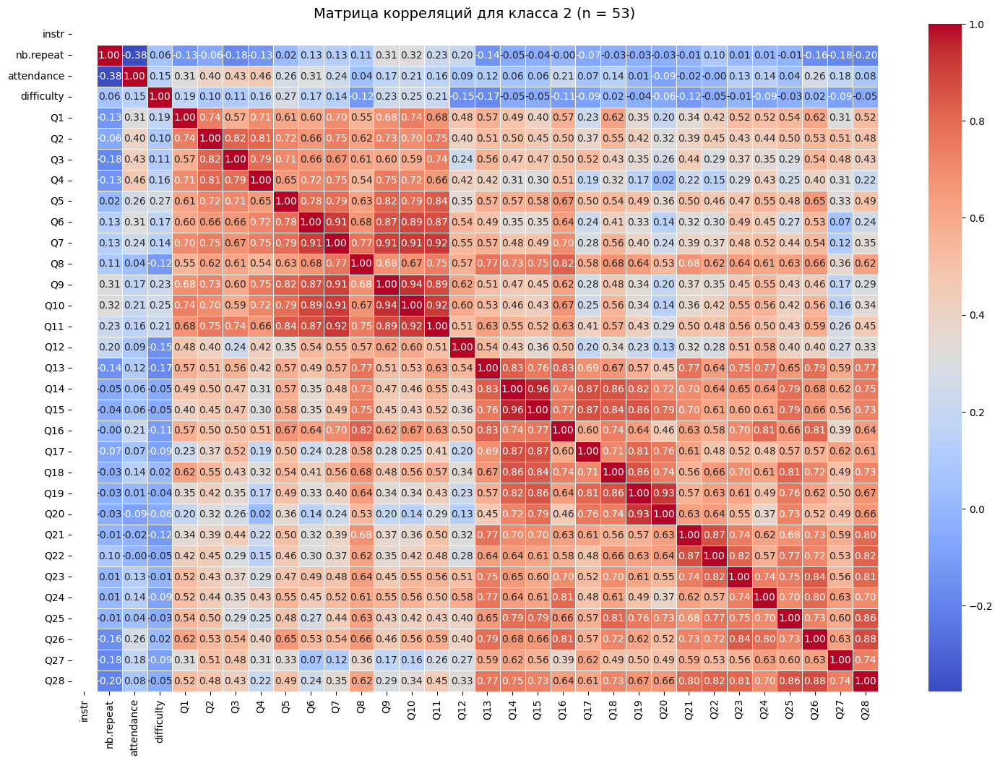

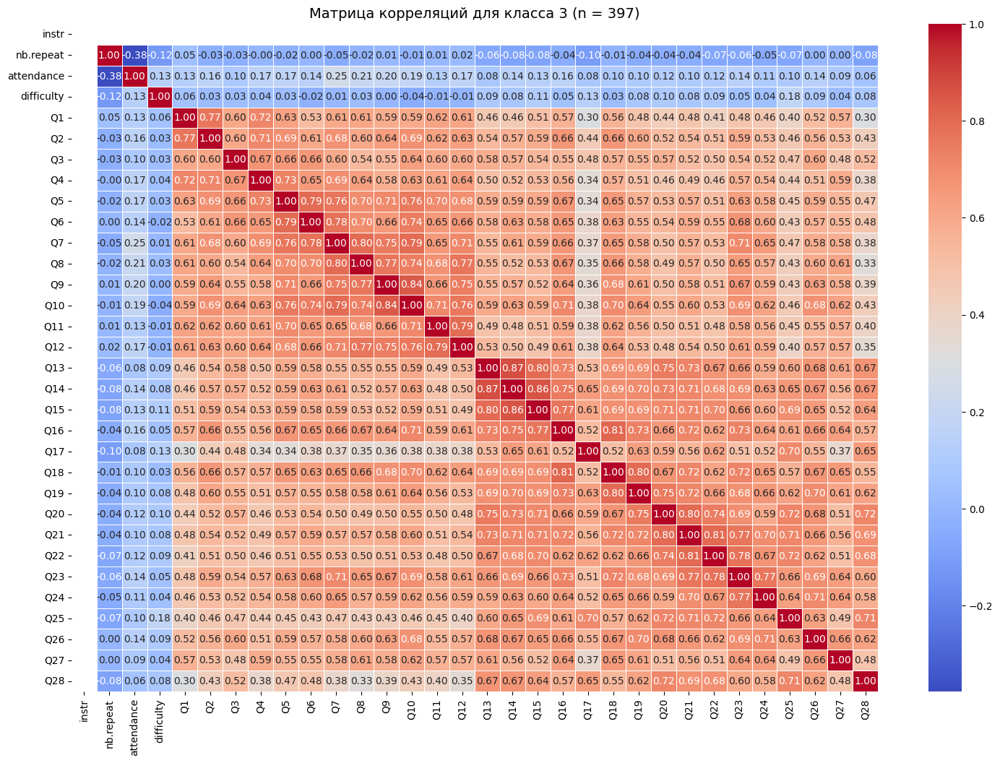

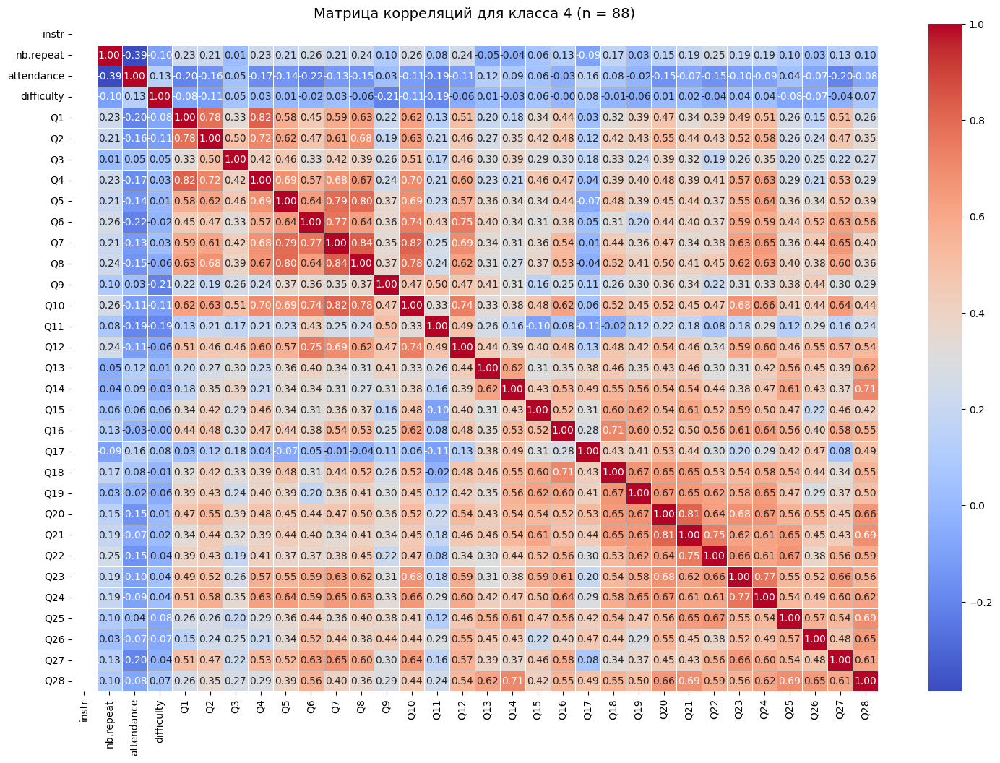

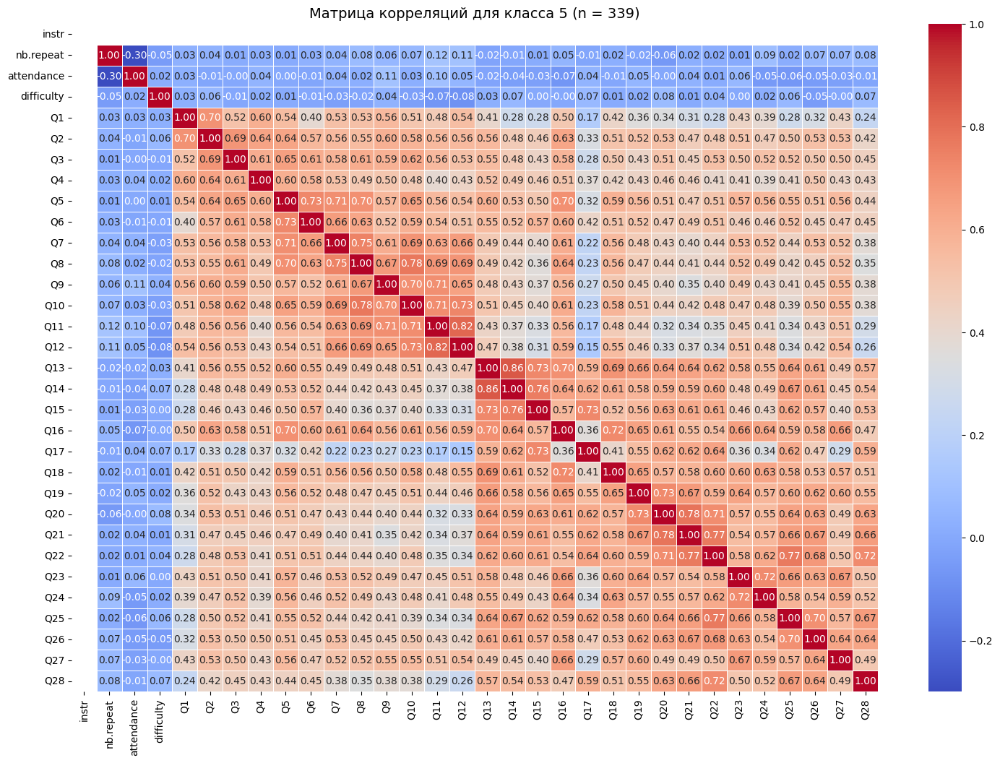

...

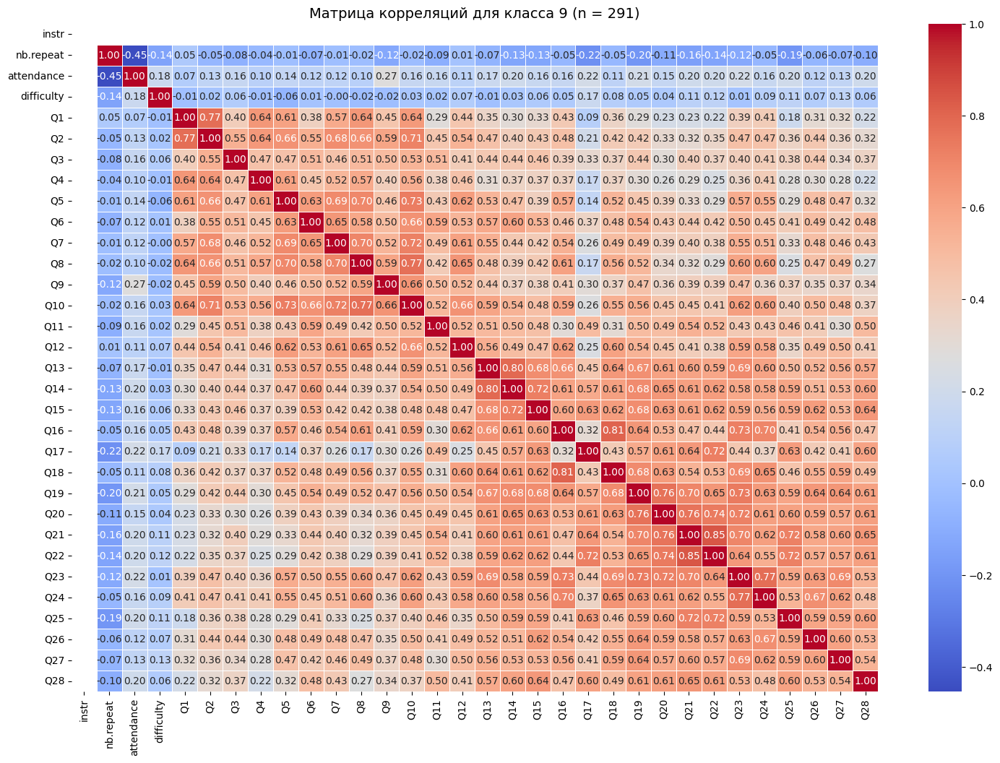

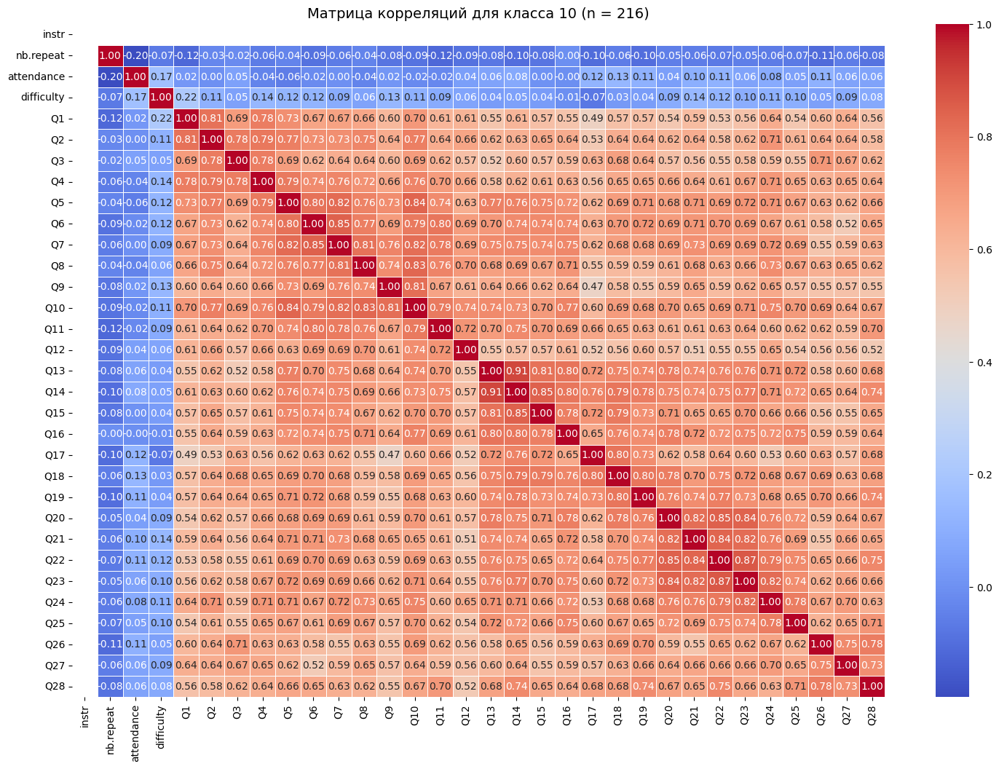

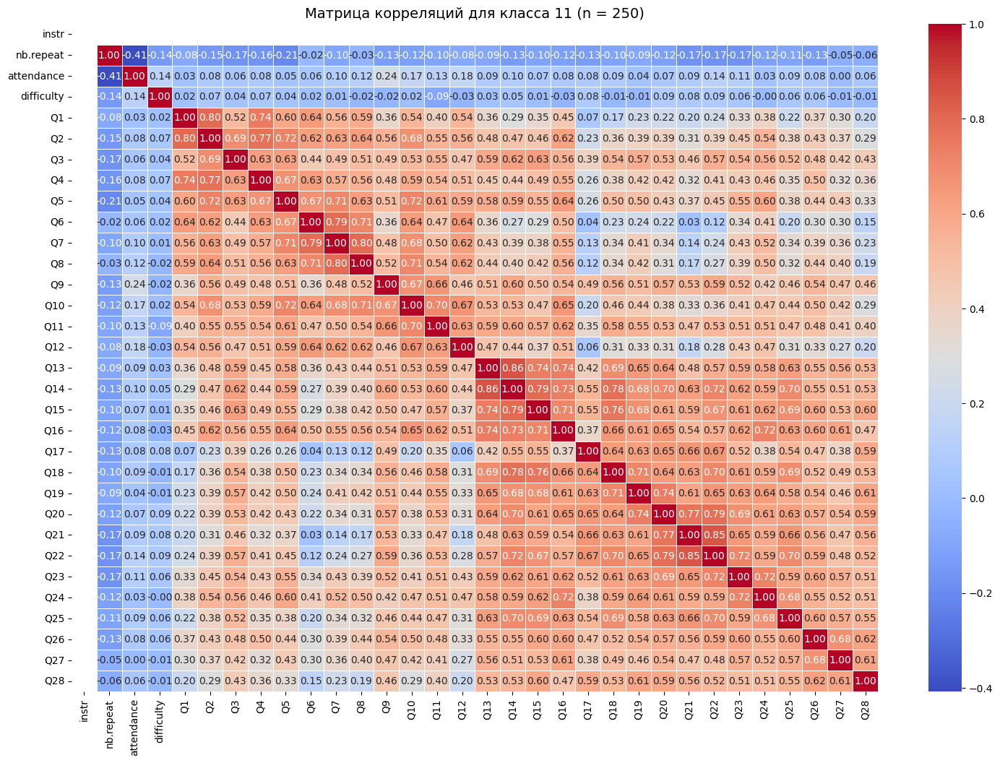

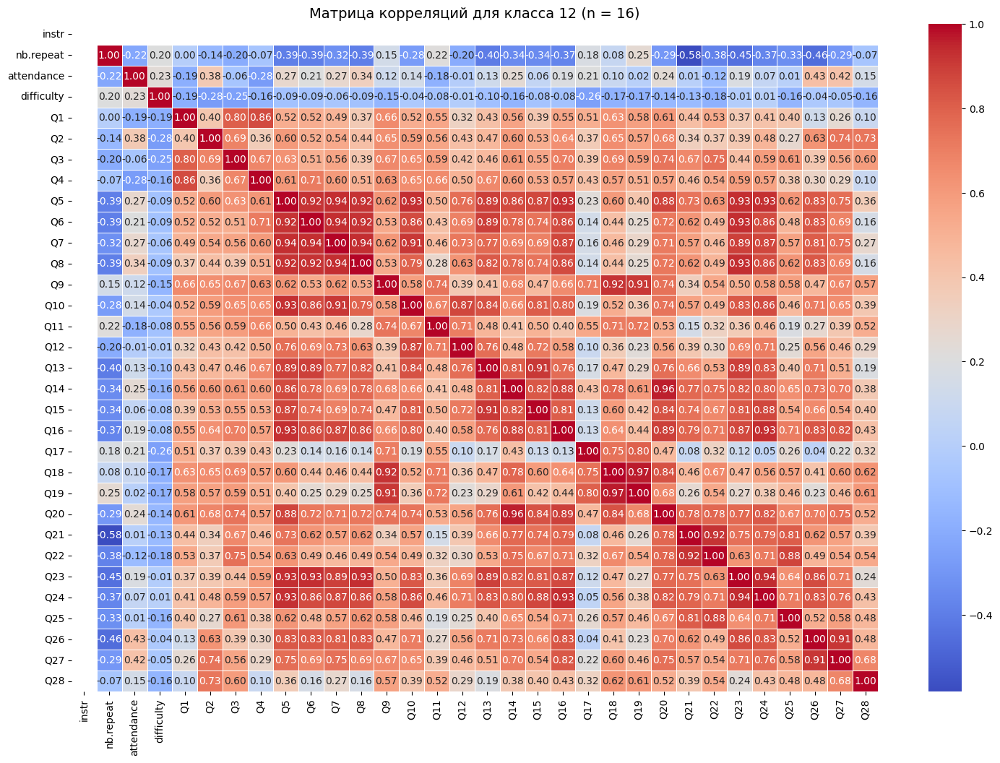

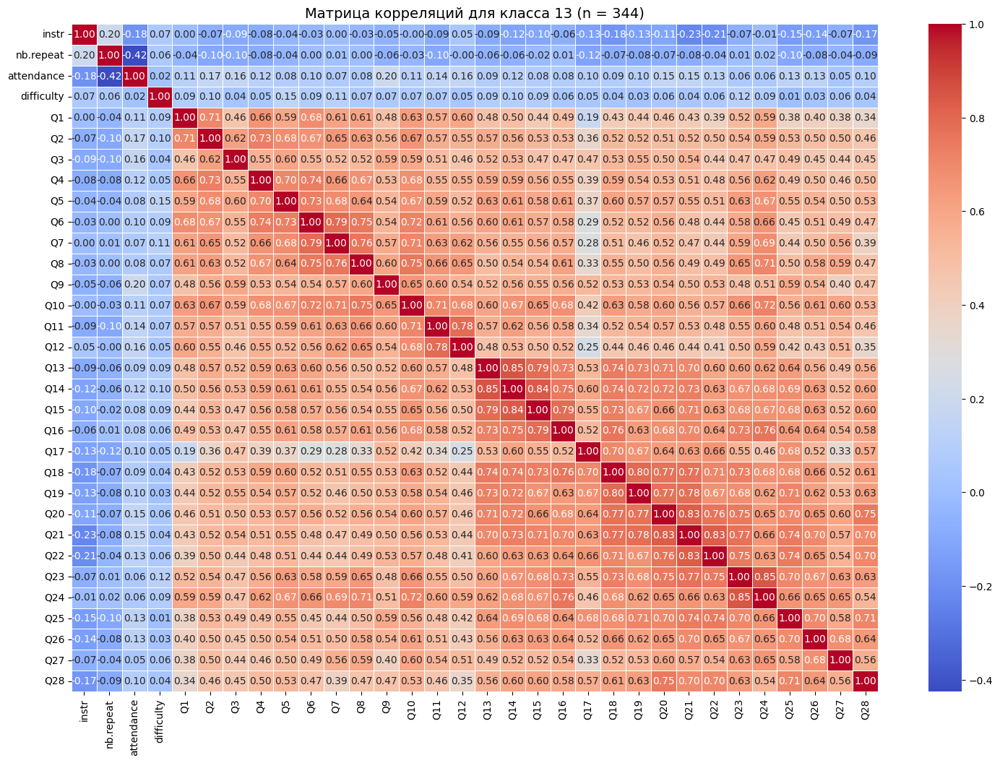

In [17]:
meta_cols = ['instr', 'nb.repeat', 'attendance', 'difficulty']
q_cols = [f"Q{i}" for i in range(1, 29)]
cols_to_corr = meta_cols + q_cols

for cls in sorted(df['class'].dropna().unique()):
    sub_df = df[df['class'] == cls]
    
    sub_df = sub_df[cols_to_corr].select_dtypes(include=['number'])
    
    matrix = sub_df.corr()
    
    if matrix.isna().all().all():
        print(f"Класс {cls}: недостаточно вариации для расчёта корреляции (все значения одинаковые).")
        continue

    plt.figure(figsize=(18, 12))
    sns.heatmap(matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    plt.title(f'Матрица корреляций для класса {cls} (n = {len(sub_df)})', fontsize=14)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()



Корреляционные матрицы по каждому классу демонстрируют схожую внутреннюю структуру:
студенты оценивают преподавателя, организацию курса и структуру обучения, разделяя эти параметры.
В общиъ чертах разнится степень вовлечённости в опрос

### 4. Проанализировать описательные статистики по преподавателям, разработать метод сравнения преподавателей по приведённым данным

In [18]:
instr_col = "instr"
Qcols = [f"Q{i}" for i in range(13, 29)]  

df_instr = df.copy()

df_instr["composite_mean"] = df_instr[Qcols].mean(axis=1)

def summary_by_instr(col):
    g = df_instr.groupby(instr_col)[col]
    summary = g.agg(
        n="count",
        mean="mean",
        median="median",
        std="std"
    )
    summary["pct_4_5"] = g.apply(lambda s: ((s >= 4).sum() / s.count()) if s.count() > 0 else np.nan)
    return summary.round(3)

summ_instr = summary_by_instr("composite_mean")
display(summ_instr)

,n,mean,median,std,pct_4_5
instr,,,,,
1,364,3.472,3.688,0.715,0.434
2,728,3.525,3.812,0.701,0.442
3,1717,3.331,3.250,0.718,0.297


In [19]:
all_outliers = []

for teacher in sorted(df_instr[instr_col].dropna().unique()):
    sub_df = df_instr[df_instr[instr_col] == teacher]

    Q1 = sub_df['composite_mean'].quantile(0.25)
    Q3 = sub_df['composite_mean'].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers_mask = (sub_df['composite_mean'] < lower_bound) | (sub_df['composite_mean'] > upper_bound)
    teacher_outliers = sub_df.loc[outliers_mask, [instr_col, 'composite_mean']]

    # добавим инфу, какой порог сработал
    teacher_outliers = teacher_outliers.assign(
        lower_bound=lower_bound,
        upper_bound=upper_bound
    )

    all_outliers.append(teacher_outliers)

all_outliers_df = pd.concat(all_outliers, ignore_index=True)

# количество выбросов по каждому преподавателю
outliers_count = all_outliers_df.groupby(instr_col).size().reset_index(name='outliers_count')
display(outliers_count)

print(f"Всего аномальных оценок по всем преподавателям: {len(all_outliers_df)}")

print("Аномальные оценки (сильно выбивающиеся) по каждому преподавателю:")
display(all_outliers_df.head())
print(f"Всего аномальных оценок: {len(all_outliers_df)}")


,instr,outliers_count
0,1,2
1,2,2
2,3,12


Всего аномальных оценок по всем преподавателям: 16
Аномальные оценки (сильно выбивающиеся) по каждому преподавателю:


,instr,composite_mean,lower_bound,upper_bound
0,1,1.0625,1.5,5.5
1,1,1.1250,1.5,5.5
2,2,1.2500,1.5,5.5
3,2,1.3750,1.5,5.5
4,3,1.3750,1.5,5.5


Всего аномальных оценок: 16


<Figure size 600x400 with 0 Axes>

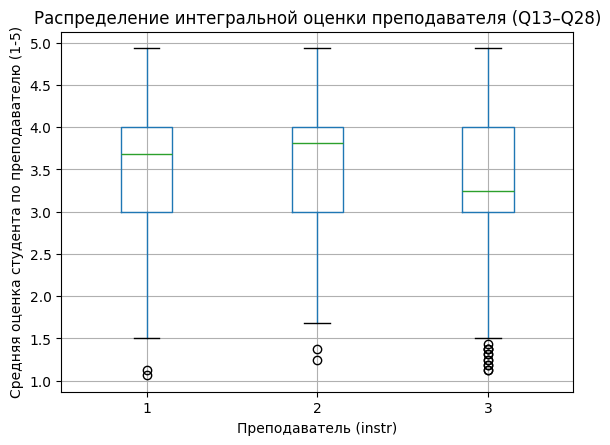

In [20]:
plt.figure(figsize=(6,4))
df_instr.boxplot(column="composite_mean", by=instr_col)
plt.title("Распределение интегральной оценки преподавателя (Q13–Q28)")
plt.suptitle("")
plt.ylabel("Средняя оценка студента по преподавателю (1-5)")
plt.xlabel("Преподаватель (instr)")
plt.show()


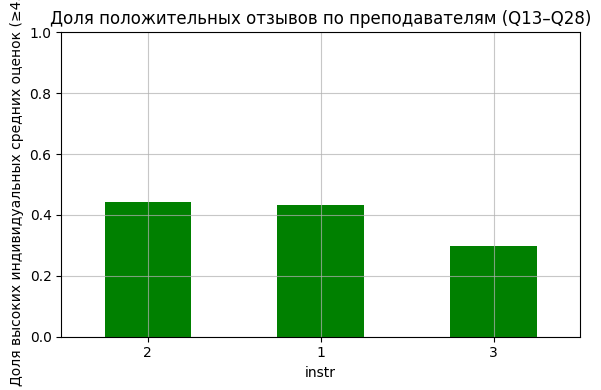

In [21]:
plt.figure(figsize=(6,4))
summ_instr.sort_values("pct_4_5", ascending=False)["pct_4_5"].plot(
    kind="bar",
    color='green',
    rot=0
)
plt.ylabel("Доля высоких индивидуальных средних оценок (≥4.0)")
plt.ylim(0,1)
plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.7)
plt.title("Доля положительных отзывов по преподавателям (Q13–Q28)")
plt.tight_layout()
plt.show()

во всех случаях присутствуют отдельные низкие оценки (выбросы).
Наибольшее количество выбросов наблюдается у преподавателя № 3,
что указывает на неоднородность мнений студентов — часть оценивает преподавателя значительно ниже среднего уровня.

### 5. Проанализировать описательные статистики по предметам, разработать метод сравнения предметов по данным из набора

In [22]:
class_col = "class"
Qcols = [f"Q{i}" for i in range(1, 29)]

df_copy = df.copy()

df_copy_class = df_copy.copy()
df_copy_class["composite_mean"] = df_copy_class[Qcols].mean(axis=1)

def summary_by_class(col):
    g = df_copy_class.groupby(class_col)[col]
    summary = g.agg(n="count", mean="mean", median="median", std="std")
    summary["pct_4_5"] = g.apply(lambda s: (s >= 4).sum() / s.count())
    return summary.round(3)

summ_class = summary_by_class("composite_mean")
display(summ_class)

all_class_outliers = []

for course in sorted(df_copy_class[class_col].dropna().unique()):
    sub_df = df_copy_class[df_copy_class[class_col] == course]

    Q1 = sub_df['composite_mean'].quantile(0.25)
    Q3 = sub_df['composite_mean'].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers_mask = (sub_df['composite_mean'] < lower_bound) | (sub_df['composite_mean'] > upper_bound)

    course_outliers = sub_df.loc[outliers_mask, [class_col, 'composite_mean']]

    course_outliers = course_outliers.assign(
        lower_bound=lower_bound,
        upper_bound=upper_bound
    )

    all_class_outliers.append(course_outliers)

all_class_outliers_df = pd.concat(all_class_outliers, ignore_index=True)

print("Аномальные оценки (выбросы) по каждому предмету:")
display(all_class_outliers_df.head())

print(f"Всего аномальных оценок по всем предметам: {len(all_class_outliers_df)}")

class_outliers_count = (
    all_class_outliers_df
    .groupby(class_col)
    .size()
    .reset_index(name='outliers_count')
    .sort_values(by='outliers_count', ascending=False)
)

print("Число выбросов по каждому предмету:")
display(class_outliers_count)


,n,mean,median,std,pct_4_5
class,,,,,
1,148,3.492,3.571,0.632,0.378
2,53,3.470,3.750,0.718,0.434
3,397,3.278,3.000,0.670,0.272
4,88,2.952,3.000,0.639,0.068
5,339,3.297,3.179,0.660,0.245
6,290,3.390,3.500,0.703,0.300
7,95,3.294,3.214,0.580,0.189
8,282,3.266,3.179,0.668,0.174
9,291,3.205,3.036,0.663,0.179


Аномальные оценки (выбросы) по каждому предмету:


,class,composite_mean,lower_bound,upper_bound
0,2,1.392857,1.500000,5.500000
1,4,1.642857,1.674107,4.209821
2,4,1.357143,1.674107,4.209821
3,4,1.607143,1.674107,4.209821
4,4,1.428571,1.674107,4.209821


Всего аномальных оценок по всем предметам: 19
Число выбросов по каждому предмету:


,class,outliers_count
4,9,7
1,4,6
5,10,2
2,7,1
0,2,1
3,8,1
6,12,1


<Figure size 1600x1400 with 0 Axes>

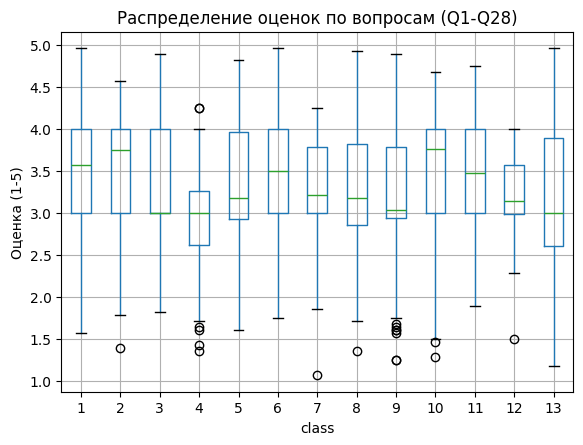

In [23]:
plt.figure(figsize=(16,14))
df_copy_class.boxplot(column="composite_mean", by=class_col)
plt.title("Распределение оценок по вопросам (Q1-Q28)")
plt.suptitle("")
plt.ylabel("Оценка (1-5)")
plt.show()

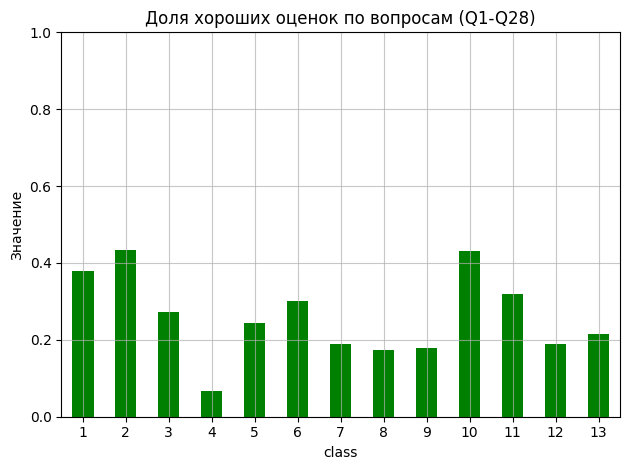

In [24]:
summ_class["pct_4_5"].plot(kind="bar", color = "green", rot=0)
plt.ylabel("Значение")
plt.title("Доля хороших оценок по вопросам (Q1-Q28)")
plt.ylim(0,1)
plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.7)
plt.tight_layout()
plt.show()

В целом анализ показал, что большинство курсов воспринимаются студентами удовлетворительно,
однако уровень положительных отзывов существенно различается.
Наиболее устойчиво и высоко оцениваются курсы № 1, 2 и 10 — они характеризуются меньшим разбросом оценок и высокой долей отзывов ≥ 4.

курс № 4 показывает самое низкое значение доли хороших оценок, что указывает на потенциальные проблемы с содержанием или организацией обучения.